# Time series Forecasting Nike Dataset

**Problem**
Given a dataset from `2017-01-01` to `2019-09-30` provide a forecasting model that would forecast the demand sales for the future months. This model will then be deployed to an API that when given a specific date will produce the forecast values to that specific date.

## Import Tools and install libraries

In [4]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
from scipy.spatial import distance
from datetime import datetime

In [5]:
import matplotlib.pylab as plt
import seaborn as sns
from matplotlib.pyplot import figure
import matplotlib.ticker as ticker
import plotly.express as px
%matplotlib inline

In [6]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from statsmodels.graphics.tsaplots import plot_acf

In [7]:
from statsmodels.tsa.api import ExponentialSmoothing
import statsmodels.api as sm
import matplotlib.dates as mdates

In [8]:
from statsmodels.tsa.statespace import sarimax
import warnings
warnings.simplefilter('once', category=UserWarning)

In [9]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

In [73]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit

In [10]:
import itertools

In [11]:
import xgboost as xgb

In [16]:
color_pal = sns.color_palette()

## Loading Dataset

In [12]:
df_trc = pd.read_csv('/content/drive/MyDrive/ML Training/data_trc.csv')
df_trc['date'] = pd.to_datetime(df_trc['date'])
df_trc['YM'] = pd.to_datetime(df_trc['date']).dt.strftime('%Y-%m')
df_trc['Year'] = pd.to_datetime(df_trc['date']).dt.strftime('%Y')
df_trc['Month'] = pd.to_datetime(df_trc['date']).dt.strftime('%m')
df_trc.set_index('date', inplace=True)

In [13]:
df_trc.head(10)

,product_id,store_id,sales,YM,Year,Month
date,,,,,,
2017-01-02,P0015,S0038,0.0,2017-01,2017,01
2017-01-02,P0015,S0085,1.0,2017-01,2017,01
2017-01-02,P0017,S0028,5.0,2017-01,2017,01
2017-01-02,P0017,S0048,9.0,2017-01,2017,01
2017-01-02,P0017,S0085,1.0,2017-01,2017,01
2017-01-02,P0018,S0028,2.0,2017-01,2017,01
2017-01-02,P0018,S0038,2.0,2017-01,2017,01
2017-01-02,P0018,S0085,0.0,2017-01,2017,01
2017-01-02,P0035,S0028,1.0,2017-01,2017,01


In [14]:
store_ids = list(df_trc['store_id'].unique())
store_ids

['S0038', 'S0085', 'S0028', 'S0048']

## Initial Plotting and observations

We plot and view the dataset given.
We can see that the data from a bigger view is condensed and we cannot initially view the trend, cyclicity, and seasonality elements of the time series.


<AxesSubplot:xlabel='date'>

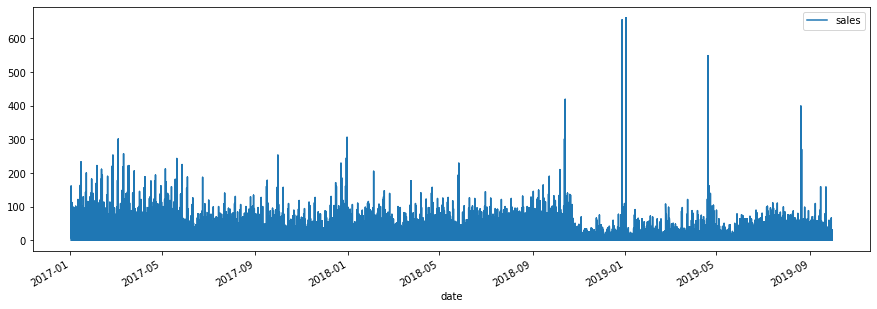

In [17]:
df_trc.plot(style='-', figsize=(15,5), color=color_pal[0])

In [18]:
split = round(len(df_trc) / 2)
X1, X2 = df_trc[0:split], df_trc[split:]
mean1, mean2 = X1['sales'].mean(), X2['sales'].mean()
var1, var2 = X1['sales'].var(), X2['sales'].var()
print('mean1=%f, mean2=%f' % (mean1, mean2))
print('variance1=%f, variance2=%f' % (var1, var2))

mean1=2.396530, mean2=1.394623
variance1=68.967750, variance2=38.597985


^ The above observations is a simple method to look if the time series is stationary. 
While the mean are only apart by 1 the variance of the split dataset has a bigger gap which indicates that this dataset timeseries is **NOT STATIONARY**

We also check below that the histogram of the dataset to view its distribution but it seems that the values are not evenly distributed

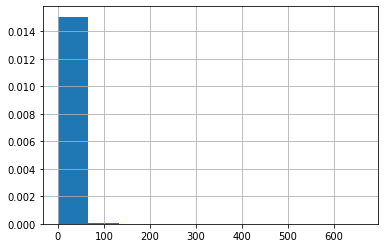

In [19]:
df_trc['sales'].hist(density=True)
plt.show()

### Dataset Columns

In the dataset there are 4 columns
* date
* sales
* store_id
* product_id

So the reason why the initial plot is condensed is that it contains multiple stores with multiple products sold per day we would need to group the stores and the sales that they have sold per day.

In [20]:
df_trc = df_trc.reset_index()
df_trc.head()

,date,product_id,store_id,sales,YM,Year,Month
0,2017-01-02,P0015,S0038,0.0,2017-01,2017,01
1,2017-01-02,P0015,S0085,1.0,2017-01,2017,01
2,2017-01-02,P0017,S0028,5.0,2017-01,2017,01
3,2017-01-02,P0017,S0048,9.0,2017-01,2017,01
4,2017-01-02,P0017,S0085,1.0,2017-01,2017,01


### Sales Aggregation per Date

In [21]:
sales_fig = px.line(df_trc.sort_values(['store_id','date']),x='date',y='sales',color='store_id',title ='Sales')
sales_fig.show()

^ We still have not aggregated it per day. So lets aggregate per day per store.

In [22]:
sales_aggregate_per_store = df_trc.groupby(['date', 'store_id']).sales.sum().reset_index()

In [43]:
mask = sales_aggregate_per_store['date'] > '2019-01-01'

In [44]:
filter_sales = sales_aggregate_per_store.sort_values(['store_id','date'])[mask].reset_index(drop=True)

<ipython-input-44-5914c0cb6632>:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [45]:
sales_fig = px.line(filter_sales,x='date',y='sales',color='store_id',title ='Sales per store (Time Series)')
sales_fig.show()

^ From here we can see a more detailed time series graph per store but as a part of the model and we would want to generalize we would need to combine these values as a whole to get the bigger picture of the time series.

But before we do that we would want to deep dive into the data and learn more of its information.

In [48]:
sales_aggregate_by_date = sales_aggregate_per_store.groupby(['date']).sales.sum().reset_index()

In [49]:
mask = sales_aggregate_by_date['date'] > '2019-01-01'

In [51]:
sales_fig = px.line(sales_aggregate_by_date[mask],x='date',y='sales',title ='Aggregated Total Sales')
sales_fig.show()

### Outlier identification
Initially we see that store `S0085` has sales that have the biggest spike in number. It might be an outlier to the model when forecasting is established. So we will keep this in mind. Outliers should be determined early on to give an idea on how the model will perform and so that it learns of a pattern excluding outliers.

We then check the distribution of the time series. We see that the distribution of the dataset has a long tail to values above roughly `1200` in sales. We can determine that values above this specific mark would be outliers

<AxesSubplot:ylabel='Frequency'>

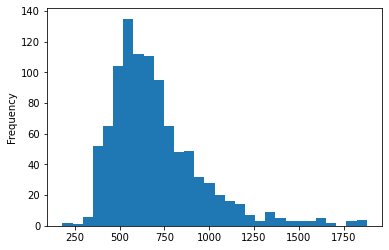

In [26]:
sales_aggregate_by_date['sales'].plot(kind='hist', bins=30)

<AxesSubplot:xlabel='date'>

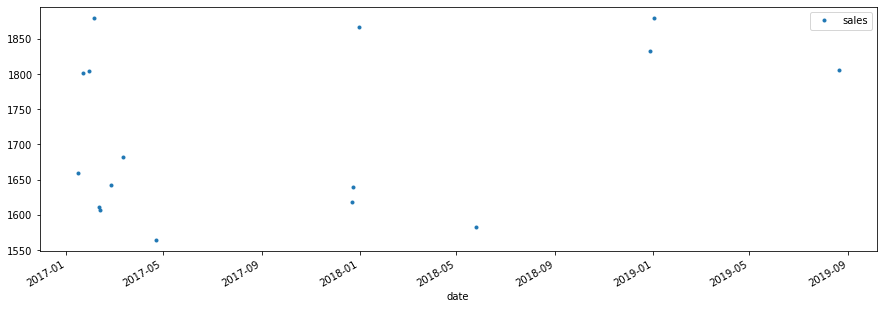

In [27]:
sales_aggregate_by_date.query('sales > 1550').plot(x='date', y='sales',figsize=(15,5), style='.')

### Time series sales performance

In [54]:
df_trc_copy = sales_aggregate_by_date.copy()
df_trc_copy['year'] = df_trc_copy.date.dt.year
df_trc_copy['month'] = df_trc_copy.date.dt.month
df_trc_copy['week'] = df_trc_copy.date.dt.dayofweek

box_plot_trans = px.box(df_trc_copy, x='year',y='sales',color='month',title='sales')
box_plot_trans.show()

So first check october 2017 and october 2018 then sort of give an idea that this is the supossed forecast for the month

Whiskers denote bounding from the upper average from the q3 or q1


In [55]:
box_plot_trans = px.box(df_trc_copy, x='month',y='sales',color='week',title='sales')
box_plot_trans.show()

### Looking at Monthly Average Sales Performance

We look at the performance of the time series dataset to look at the trend 

In [57]:
# Sampling Them Monthly
box_data = df_trc_copy.groupby(['year','month']).sales.mean().reset_index()
monthly_trans = px.line(box_data,x='month',y='sales',color='year',title='Monthly average Sales')
monthly_trans.show()

In [58]:
# Sampling Them Monthly
box_data = df_trc_copy.set_index('date').resample('MS').sales.mean().reset_index()
box_data['year'] = box_data.date.dt.year 
monthly_trans = px.line(box_data,x='date',y='sales',color='year',title='Monthly average sales')
monthly_trans.show()

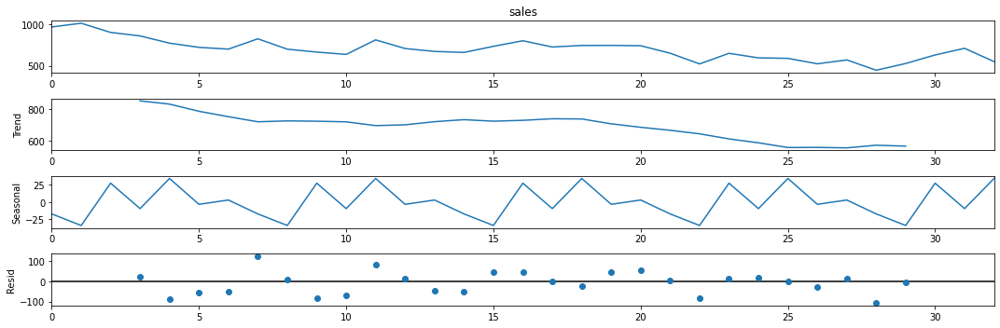

In [59]:
decompose_data = sales_aggregate_by_date.set_index('date').resample('MS').sales.mean().reset_index()
decompose = seasonal_decompose(decompose_data['sales'],model='additive', period=7)
fig = decompose.plot()
fig.set_size_inches((15, 5))
# Tight layout to realign things
fig.tight_layout()
plt.show()

In [ ]:
week_group = df_trc_copy.groupby(['year','week']).sales.mean().reset_index()
week_group_plot = px.line(week_group,x ='week',y='sales',color ='year')
week_group_plot.show()

### Checking Stationarity

The trend and seasonality will affect the value of the time series at different times. Traditionally, we would be looking for consistency over time, for example by using the mean or the variance of the observations. When a time series is stationary, it can be easier to model and statistical modeling methods usually assume or require the time series to be stationary.


In [ ]:
adf_test_sales = adfuller(list(sales_aggregate_by_date["sales"]))

print("Retail sales results:")
print("ADF = " + str(adf_test_sales[0]))
print("p-value = " +str(adf_test_sales[1]))
print('Critical Values:')
for key, value in adf_test_sales[4].items():
    print(key, value)

Retail sales results:
ADF = -3.2640842241510324
p-value = 0.016562256565833367
Critical Values:
1% -3.4370403176323214
5% -2.8644937368358425
10% -2.5683427207413576


In the case of our data we see that the p-value is less than 0.05 which we can assume that our data is stationary

Running the example prints the test statistic value of -3. The more negative this statistic, the more likely we are to reject the null hypothesis (we have a stationary dataset).

As part of the output, we get a look-up table to help determine the ADF statistic. We can see that our statistic value of -3 is less than the value of -2.86 at 5%.

This suggests that we can reject the null hypothesis with a significance level of less than 5% (i.e. a mid-tier probability that the result is a statistical fluke).

Stationarity means that the statistical properties of a process generating a time series do not change over time.

It is also important for models such as ARIMA because they take into consideration stationarity into their models.

References: https://machinelearningmastery.com/time-series-data-stationary-python/

https://towardsdatascience.com/stationarity-in-time-series-analysis-90c94f27322

### Checking Correlation

When looking at a time series data, one element that we are looking for is a pattern that repeats in time. One key concept related to this idea is ***autocorrelation***.

***autocorrelation corresponds to the similarity between observations as a function of the time lag between them.***

It means to the idea of finding structure of the observations in the time-series by looking at the relationship between observations within themselves at different points in time to find **PATTERNS**

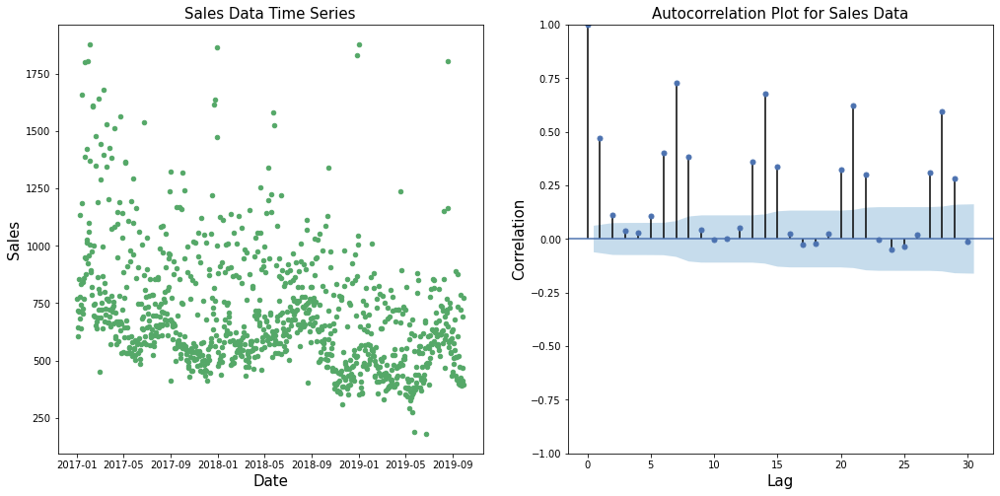

In [ ]:
#Plotting the raw weather data
fig = plt.figure(figsize=(17,8))
ax1 = fig.add_subplot(121)

green = sns.color_palette("deep", 8)[2]
blue = sns.color_palette("deep", 8)[0]

plt.scatter(sales_aggregate_by_date["date"],sales_aggregate_by_date["sales"], color=green,s=20)
plt.title("Sales Data Time Series",fontsize=15)
plt.xlabel("Date",fontsize=15)
plt.ylabel("Sales",fontsize=15)


# Plotting the autocorrelation plot
ax2 = fig.add_subplot(122)
plot_acf(sales_aggregate_by_date["sales"], ax=ax2,color=blue, lags=30)
plt.title("Autocorrelation Plot for Sales Data", fontsize=15)
plt.ylabel("Correlation",fontsize=15)
plt.xlabel("Lag",fontsize=15)
plt.show()

Given the number of factors that go into predicting sales, we should not expect the data to have perfectly clear correlations. However, it's interesting to observe spikes of correlation that could be associated with factors that relate to the type of product involved. 

For example some areas could have higher performances because it is christmas or the start of the new year

So from the lag we can see significant coeeficients every after 7 lags which could indicate we could perform a 7 day moving average.

The ACF plot can help us determine the order of the moving average process. 

### Traditional Time Series Models to Sales Forecasting

##### Moving Average

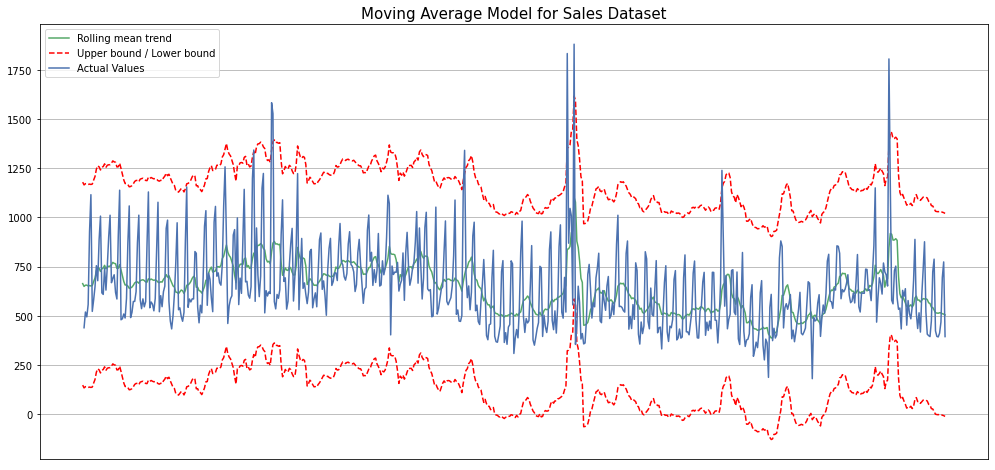

In [ ]:
green = sns.color_palette("deep", 8)[2]
blue = sns.color_palette("deep", 8)[0]

start_date = "2018-01-01"
end_date = "2019-10-30"
date_range = (sales_aggregate_by_date["date"] > start_date) & (sales_aggregate_by_date["date"] < end_date)
df_sales_ma = sales_aggregate_by_date.loc[date_range]
series = df_sales_ma["sales"]

window=7
rolling_mean = series.rolling(window=window).mean()
fig,ax = plt.subplots(figsize=(17,8))

plt.title('Moving Average Model for Sales Dataset',fontsize=15)
plt.plot(rolling_mean, color=green, label='Rolling mean trend')
#Plot confidence intervals for smoothed values
mae = mean_absolute_error(series[window:], rolling_mean[window:])
deviation = np.std(series[window:] - rolling_mean[window:])
lower_bound = rolling_mean - (mae + 2 * deviation)
upper_bound = rolling_mean + (mae + 2 * deviation)
plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
plt.plot(lower_bound, 'r--')
plt.plot(series[window:],color=blue, label="Actual Values")

plt.legend(loc='best')
plt.grid(True)
plt.xticks([])

plt.show()

##### Exponential Smoothing

In [ ]:
whole_features = create_features(sales_aggregate_train)

In [ ]:
fit1 = ExponentialSmoothing(whole_features[FEATURES]).fit(smoothing_level=0.1, optimized=False)

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ValueError: ignored

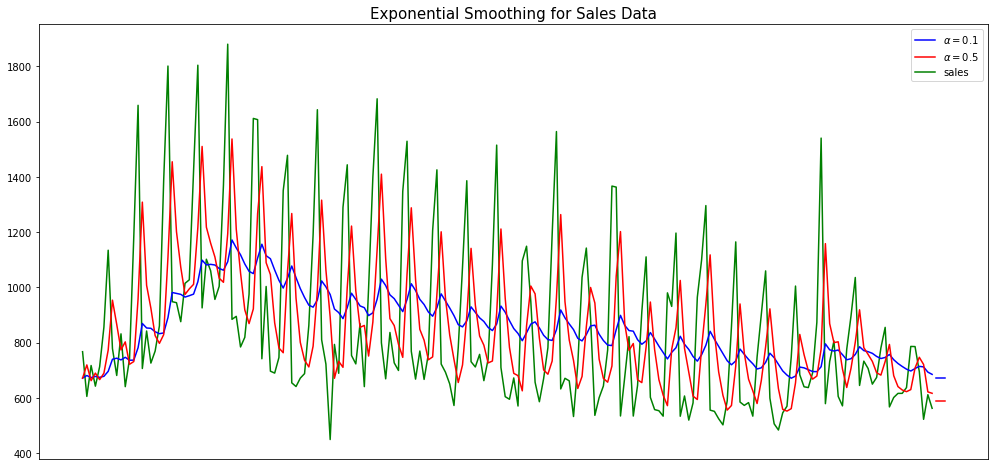

In [ ]:
fit1 = ExponentialSmoothing(sales_aggregate_by_date["sales"][0:200]).fit(smoothing_level=0.1, optimized=False)
fit2 = ExponentialSmoothing(sales_aggregate_by_date["sales"][0:200]).fit(smoothing_level=0.5, optimized=False)
forecast1 = fit1.forecast(3).rename(r'$\alpha=0.1$')
forecast2 = fit2.forecast(3).rename(r'$\alpha=0.5$')
plt.figure(figsize=(17,8))

forecast1.plot(color='blue', legend=True)
forecast2.plot(color='red', legend=True)
sales_aggregate_by_date["sales"][0:200].plot(marker='',color='green', legend=True)
fit1.fittedvalues.plot(color='blue')
fit2.fittedvalues.plot(color='red')
plt.title("Exponential Smoothing for Sales Data", fontsize=15)
plt.xticks([])

plt.show()

##### ARIMA Model

MSE error: 45738.69449218427


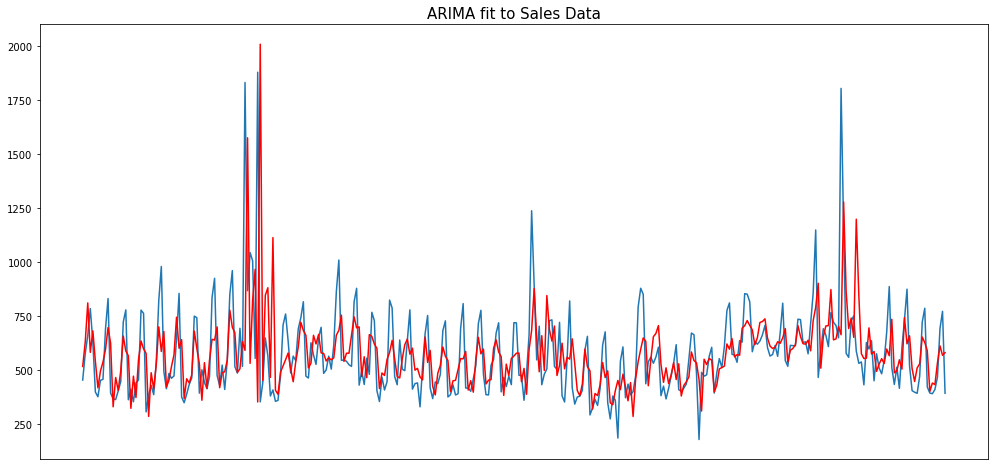

In [ ]:
X = sales_aggregate_by_date["sales"].values

split = int(0.66*len(X))
train, test = X[0:split], X[split:]

history = [x for x in train]
predictions = []
for t in range(len(test)):
	model = sm.tsa.arima.ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
    
	obs = test[t]
	history.append(obs)
mse = mean_squared_error(test, predictions)

print(f"MSE error: {mse}")

plt.figure(figsize=(17,8))
plt.plot(test)
plt.plot(predictions, color='red')
plt.title("ARIMA fit to Sales Data",fontsize=15)
plt.xticks([])
plt.show()

Let’s just remember that the results here are merely to showcase the models and do not represent an accurate estimate. The datasets are limited (the retail sales dataset after summing is smaller than 200 data points) and I did not perform any complex hyperparameter tuning. The goal here was just to demonstrate how these models work and how they can be implemented in python. We can verify that the retail dataset seems to present challenges that the traditional models fail to overcome.

We can see that, for datasets that have a clear pattern, traditional models work well. However, in the absence of such a structure, these models don’t seem to present the flexibility to adapt because they rely on strong assumptions regarding the dynamics of the target time-series.

References:
https://towardsdatascience.com/sales-forecasting-from-time-series-to-deep-learning-5d115514bfac

## Model Training and Development

Traditional Time Series Models for Sales Forecasting

- Moving Average
- Exponential Smoothing
- Arima

Other Models:
- Linear Regression
- XGBoost

Generic Metrics:
- Mean Absolute Error
- Root Mean Squared Error
- MAPE


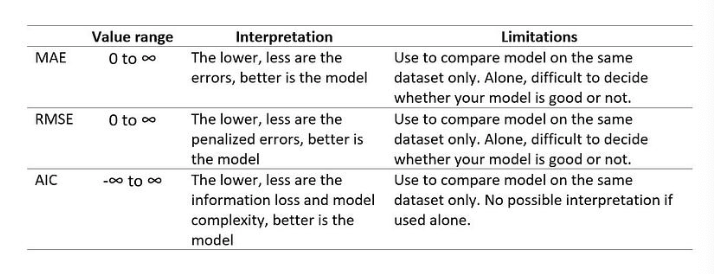


With MAE and RMSE the perfect score is 0 (or to have the lower possible score) Both values range from 0 to infinity and depend on the scale of the target we want to forecast

MAE is the easiest to interpret. For example if MAE is 450 dollars, we could say that our forecasting model have an average error of 450 dollars per forecast (+ or -). Very easy to explain to a manager or a business team. Is it good? Should we use it? Well, it depends on the use case context, the distribution of the errors (skewed or not, outliers or not) and many other things.

RMSE interpretation is less intuitive. If RMSE is 450, we could say that our forecasting model have an “penalized” average error of 450 dollars per forecast, which is somewhat not very intuitive.

For AIC, there is no perfect score, the lower is the better. Soo it is not possible to evaluate the AIC score alone, it is only use to compare models together. For example, if used alone, an AIC of -950 does not give any clue about the model performance and impossible to explain to a manager.

MAPE and MASE are common metrics to use for time series

References: https://medium.com/@dave.cote.msc/rdr-score-metric-for-evaluating-time-series-forecasting-models-1c23f92f80e7
https://datascience.stackexchange.com/questions/77748/best-common-metric-for-comparing-classic-time-series-forecasting-methods-arima


### Feature Creation

In [60]:
print(len(sales_aggregate_by_date)) # <- total number of 
print(len(sales_aggregate_by_date.query('sales < 1550'))) # <- removing far outlier sales units 

1002
986


In [61]:
def add_lags(df):
  """
  Create lag features for the dataframe
  """
  target_map = df['sales'].to_dict()
  df['lag1'] = (df.index - pd.Timedelta('32 days')).map(target_map)
  df['lag2'] = (df.index - pd.Timedelta('62 days')).map(target_map)
  df['lag3'] = (df.index - pd.Timedelta('92 days')).map(target_map)
  return df

In [62]:
def create_features(df) :
  """
  Create time series features based on time series index
  """
  # df = df.to_frame()
  df = df.copy()
  df['dayofweek'] = df.index.dayofweek
  df['quarter'] = df.index.quarter
  df['month'] = df.index.month
  df['year'] = df.index.year
  df['dayofyear'] = df.index.dayofyear
  # df['weekofyear'] = int(df.index.isocalendar().week)
  df['day'] = df.index.day

  df = add_lags(df)

  return df

In [74]:
def fill_nan(df, imputer, features):

  df = df.copy()
  for feature in features:
    df[feature] = imputer.fit_transform(df[feature].values.reshape(-1,1))[:,0]
  
  return df

### train/test split

In [75]:
from sklearn.model_selection import TimeSeriesSplit

In [76]:
sales_aggregate_train = sales_aggregate_by_date.copy()

In [77]:
sales_aggregate_train = sales_aggregate_train.set_index('date')
sales_aggregate_train = sales_aggregate_train.sort_index()
sales_aggregate_train

,sales
date,
2017-01-02,767.294
2017-01-03,605.482
2017-01-04,717.250
2017-01-05,642.558
2017-01-06,712.956
...,...
2019-09-26,411.500
2019-09-27,468.114
2019-09-28,694.000


In [66]:
tss = TimeSeriesSplit(n_splits=5, test_size=30, gap=1)

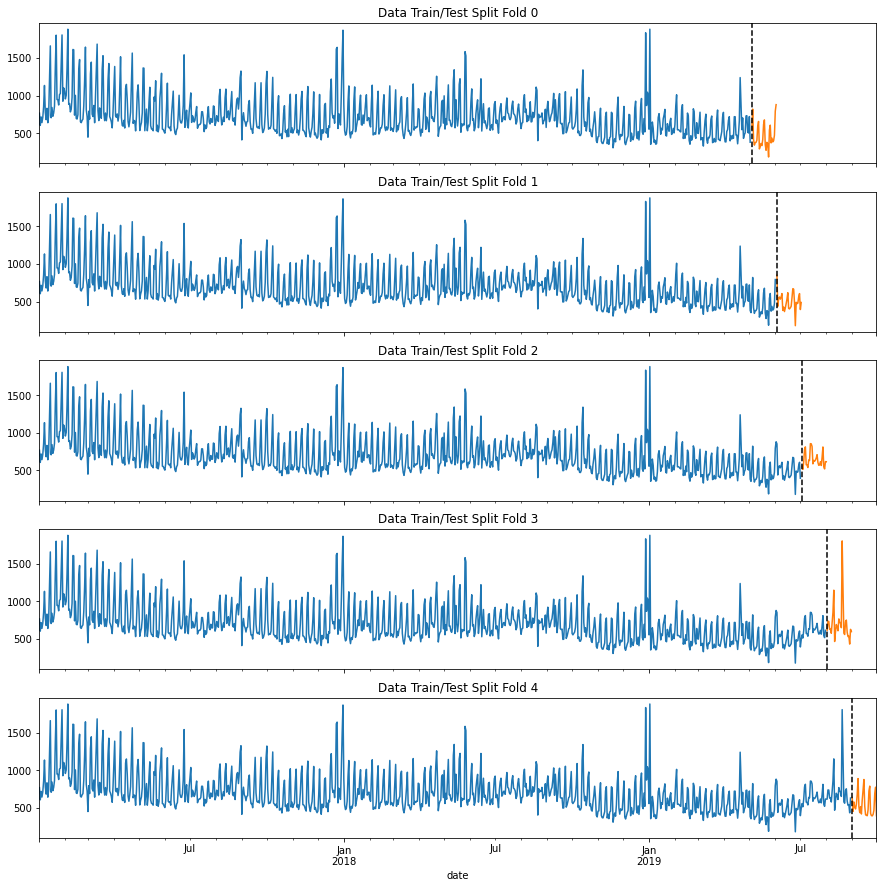

In [67]:
fig,axs = plt.subplots(5,1, figsize=(15,15),
                            sharex=True
                            )
fold = 0
for train_idx, val_idx in tss.split(sales_aggregate_train):
  train = sales_aggregate_train.iloc[train_idx]
  test = sales_aggregate_train.iloc[val_idx]

  train['sales'].plot(ax=axs[fold],
                      label='Training Set',
                      title=f'Data Train/Test Split Fold {fold}')
  test['sales'].plot(ax=axs[fold],
                      label='Training Set')
  axs[fold].axvline(test.index.min(), color='black', ls='--')
  fold += 1

### My forecasting Horizon

Forecasting horizon is 1 month 

In [68]:
FEATURES = ['dayofweek', 'quarter', 'month',
       'year', 'dayofyear', 'day',
       'lag1', 'lag2', 'lag3']
TARGET = 'sales'


In [69]:
scores_models = {}

### Creating unforseen Dataset

In [70]:
future = pd.date_range('2019-10-01', '2019-10-31', freq = 'D')
df_unseen = pd.DataFrame(index = future)
df_unseen['sales'] = np.nan
df_unseen['isFuture'] = True
sales_aggregate_train['isFuture'] = False
df_and_future = pd.concat([sales_aggregate_train, df_unseen])
df_and_future

,sales,isFuture
2017-01-02,767.294,False
2017-01-03,605.482,False
2017-01-04,717.250,False
2017-01-05,642.558,False
2017-01-06,712.956,False
...,...,...
2019-10-27,NaN,True
2019-10-28,NaN,True
2019-10-29,NaN,True
2019-10-30,NaN,True


In [120]:
df_and_future = create_features(df_and_future)
df_and_future

,sales,isFuture,dayofweek,quarter,month,year,dayofyear,day,lag1,lag2,lag3
2017-01-02,767.294,False,0,1,1,2017,2,2,NaN,NaN,NaN
2017-01-03,605.482,False,1,1,1,2017,3,3,NaN,NaN,NaN
2017-01-04,717.250,False,2,1,1,2017,4,4,NaN,NaN,NaN
2017-01-05,642.558,False,3,1,1,2017,5,5,NaN,NaN,NaN
2017-01-06,712.956,False,4,1,1,2017,6,6,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2019-10-27,NaN,True,6,4,10,2019,300,27,392.198,589.272,674.590
2019-10-28,NaN,True,0,4,10,2019,301,28,411.500,532.766,811.144
2019-10-29,NaN,True,1,4,10,2019,302,29,468.114,539.000,546.000
2019-10-30,NaN,True,2,4,10,2019,303,30,694.000,433.000,518.934


In [72]:
future_w_features = df_and_future.query('isFuture').copy()


### Creating feature dataset for training

In [83]:
features_dataset = create_features(sales_aggregate_train)
imputer = SimpleImputer(missing_values=np.NaN, strategy='mean')
features_dataset = fill_nan(features_dataset, imputer, ['lag1', 'lag2', 'lag3'])

In [84]:
features_dataset_x = features_dataset[FEATURES]
features_dataset_y = features_dataset[TARGET]

In [96]:
start_date = '2017-01-01'
end_date = '2019-09-01'
# Select DataFrame rows between two dates
mask = (features_dataset.index > start_date) & (features_dataset.index < end_date)

cut_off_date_start = '2019-09-01'
cut_off_date_end = '2019-09-30'
mask_test = (features_dataset.index >= cut_off_date_start) & (features_dataset.index <= cut_off_date_end)

train = features_dataset.loc[mask]
test = features_dataset.loc[mask_test]

x_test_set = test[FEATURES]
y_test_set = test[TARGET]

x_train_set = train[FEATURES]
y_train_set = train[TARGET]

### Model Training
- Linear Regression
- Random Forests
- XGBoost Regression

In [82]:
tss = TimeSeriesSplit(n_splits=5, test_size=100, gap=1)

In [133]:
lr_model = LinearRegression()
param_search = {'n_jobs' : [1, 3]}

g_lr_search = GridSearchCV(estimator=lr_model, cv=tss, param_grid=param_search, refit = True)
g_lr_search.fit(features_dataset_x, features_dataset_y)

print(f'Model: {lr_model} best params are: {g_lr_search.best_params_}')

Model: LinearRegression() best params are: {'n_jobs': 1}


In [136]:
rf_model = RandomForestRegressor()
param_search = {'n_estimators' : [100, 1000]}

g_rf_search = GridSearchCV(estimator=rf_model, cv=tss, param_grid=param_search, refit = True)
g_rf_search.fit(features_dataset_x, features_dataset_y)

print(f'Model: {lr_model} best params are: {g_rf_search.best_params_}')

Model: LinearRegression() best params are: {'n_estimators': 100}


In [137]:
xgb_model = xgb.XGBRegressor(base_score=0.5,
                         booster='gbtree',
                         objective='reg:squarederror',
                         learning_rate=0.01,
                         early_stopping_rounds=100)
param_search = {'n_estimators' : [100, 1000], 'max_depth' : [5,6,7,9]}

g_xgb_search = GridSearchCV(estimator=xgb_model, cv=tss, param_grid=param_search, refit = True)
g_xgb_search.fit(features_dataset_x, features_dataset_y)

print(f'Model: {xgb_model} best params are: {g_xgb_search.best_params_}')

Model: XGBRegressor(early_stopping_rounds=100, learning_rate=0.01,
             objective='reg:squarederror') best params are: {'max_depth': 5, 'n_estimators': 1000}


In [138]:
def get_scores(model_trained, test_set_x, test_set_y) :
  y_pred = model_trained.predict(test_set_x)
  rmse = sqrt(mean_squared_error(test_set_y, y_pred))
  mae = mean_absolute_error(test_set_y, y_pred)
  mape = mean_absolute_percentage_error(test_set_y, y_pred)
  return {"rmse" : rmse,
          "mae" : mae,
          "mape" : mape*100}


In [139]:
def get_model_comp(x_set, y_set):
  model_scores = {}
  model_scores['linear_regression'] = get_scores(g_lr_search, x_set, y_set)
  model_scores['random_forest'] = get_scores(g_rf_search, x_set, y_set)
  model_scores['xgboost_reg'] = get_scores(g_xgb_search, x_set, y_set)

  min_scores = {}
  for key, val in model_scores.items():
    print(key, val)
    minPricedrmse = val['rmse']
    # print(minPricedrmse)
    minPricedmae = val['mae']
    # print(minPricedmae)
    minPricedmape = val['mape']
    # print(minPricedmape)

    min_scores[key] = {'rmse' : minPricedrmse, 'mae' : minPricedmae, 'mape' : minPricedmape}
  pd.DataFrame(min_scores).plot(kind='bar')

linear_regression {'rmse': 192.20265012609948, 'mae': 136.37646280902067, 'mape': 20.206360134639883}
random_forest {'rmse': 54.34068918551299, 'mae': 32.962423744856, 'mape': 4.700117711186244}
xgboost_reg {'rmse': 68.80455695392347, 'mae': 48.55759365505642, 'mape': 7.386344531541264}


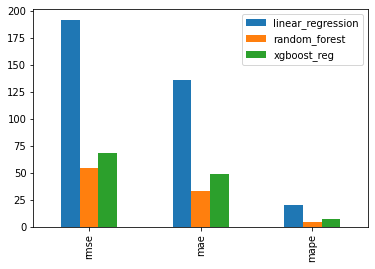

In [140]:
get_model_comp(x_train_set, y_train_set)

linear_regression {'rmse': 112.4498339612103, 'mae': 94.28127170224654, 'mape': 17.3984213582502}
random_forest {'rmse': 48.05838693661732, 'mae': 29.450077333333184, 'mape': 5.674861312144321}
xgboost_reg {'rmse': 45.717758040497635, 'mae': 36.86593790690105, 'mape': 7.23249370159573}


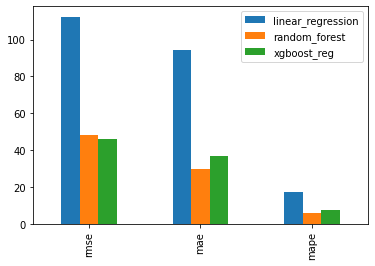

In [141]:
get_model_comp(x_test_set, y_test_set)

### Test on unforseen dataset

<AxesSubplot:title={'center':'Feature Importance (XGBoost)'}>

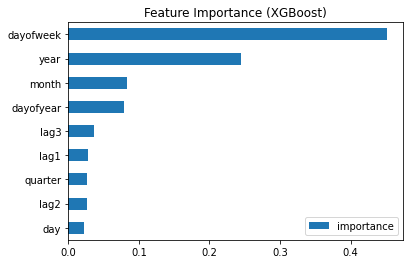

In [147]:
fi = pd.DataFrame(data=g_xgb_search.best_estimator_.feature_importances_,
             index=g_xgb_search.best_estimator_.get_booster().feature_names,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance (XGBoost)')

<AxesSubplot:title={'center':'Feature Importance (RandomForests)'}>

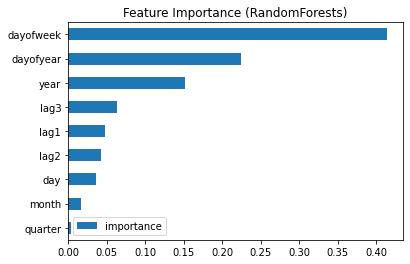

In [148]:
fi = pd.DataFrame(data=g_rf_search.best_estimator_.feature_importances_,
             index=g_rf_search.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance (RandomForests)')

In [151]:
future_w_features['prediction_lr'] = g_lr_search.predict(future_w_features[FEATURES])
future_w_features['prediction_rf'] = g_rf_search.predict(future_w_features[FEATURES])
future_w_features['prediction_xgb'] = g_xgb_search.predict(future_w_features[FEATURES])
future_w_features.head()

,sales,isFuture,dayofweek,quarter,month,year,dayofyear,day,lag1,lag2,lag3,prediction_,prediction_rf,prediction_xgb,prediction_lr
2019-10-01,NaN,True,1,4,10,2019,274,1,629.000,616.154,395.00,326.422549,432.80918,454.609833,326.422549
2019-10-02,NaN,True,2,4,10,2019,275,2,599.010,614.506,488.56,413.495961,443.38032,460.118988,413.495961
2019-10-03,NaN,True,3,4,10,2019,276,3,637.556,614.136,554.58,489.117799,442.75546,469.905731,489.117799
2019-10-04,NaN,True,4,4,10,2019,277,4,452.000,737.088,513.00,569.067449,487.47242,490.353333,569.067449
2019-10-05,NaN,True,5,4,10,2019,278,5,577.110,734.992,612.00,638.527395,789.36882,720.338074,638.527395


### Plot Results of the different Models

In [152]:
# Merge two DataFrames by index using pandas.merge()
df2 = pd.merge(df_and_future, future_w_features[['prediction_lr', 'prediction_rf', 'prediction_xgb']], how="left", left_index=True, right_index=True)

In [153]:
start_date = '2019-06-01'
end_date = '2019-10-30'
# Select DataFrame rows between two dates
mask = (df2.index > start_date) & (df2.index < end_date)
df2_plt = df2[mask]

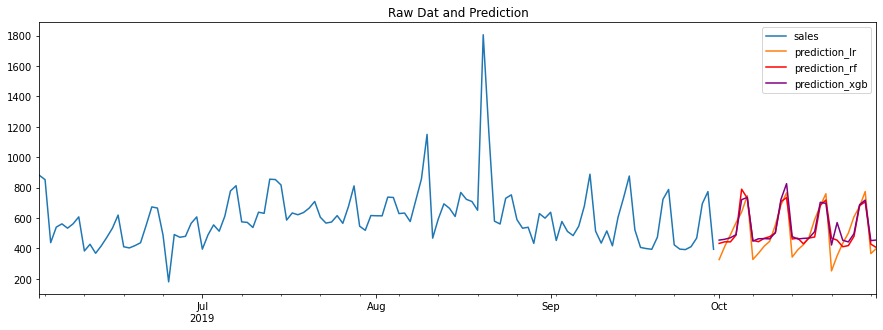

In [154]:
ax = df2_plt[['sales']].plot(figsize=(15,5))
df2_plt['prediction_lr'].plot(ax=ax, style='-')
df2_plt['prediction_rf'].plot(ax=ax, style='-', color='red')
df2_plt['prediction_xgb'].plot(ax=ax, style='-', color='purple')
plt.legend(['sales', 'prediction_lr', 'prediction_rf', 'prediction_xgb'])
ax.set_title('Raw Dat and Prediction')
plt.show()

In [193]:
start_date = '2017-10-01'
end_date = '2017-10-30'
# Select DataFrame rows between two dates
mask = (df2.index >= start_date) & (df2.index <= end_date)
df_2017 = df2[mask].reset_index()
df_2017['year'] = 1
df_2017['model'] = 'raw'
df_2017 = df_2017[['sales','year', 'model']]

In [192]:
start_date = '2018-10-01'
end_date = '2018-10-30'
# Select DataFrame rows between two dates
mask = (df2.index >= start_date) & (df2.index <= end_date)
df_2018 = df2[mask].reset_index()
df_2018['year'] = 2
df_2018['model'] = 'raw'
df_2018 = df_2018[['sales','year', 'model']]

In [194]:
concat_2017_2018 = pd.concat([df_2017,df_2018])

In [195]:
start_date = '2019-10-01'
end_date = '2019-10-30'
# Select DataFrame rows between two dates
mask = (df2.index >= start_date) & (df2.index <= end_date)
df_2019_lr = df2[mask].copy().reset_index()
df_2019_lr['year'] = 3
df_2019_rf = df2[mask].copy().reset_index()
df_2019_rf['year'] = 4
df_2019_xg = df2[mask].copy().reset_index()
df_2019_xg['year'] = 5

df_2019_lr['sales'] = df_2019_lr['prediction_lr']
df_2019_rf['sales'] = df_2019_rf['prediction_rf']
df_2019_xg['sales'] = df_2019_xg['prediction_xgb']

df_2019_lr['model'] = 'lr'
df_2019_rf['model'] = 'rf'
df_2019_xg['model'] = 'xgb'

In [196]:
october_eval = pd.concat([concat_2017_2018, df_2019_lr, df_2019_rf, df_2019_xg])[['sales', 'year', 'model']]

In [198]:
box_plot_trans = px.box(october_eval, x='year',y='sales',color='model',title='sales')
box_plot_trans.show()

## Sample Trainings

### XGBoost Model Training and Results Cross Validation

#### Model Training

[0]	validation_0-rmse:766.177	validation_1-rmse:728.549
[999]	validation_0-rmse:207.124	validation_1-rmse:177.205
[0]	validation_0-rmse:757.969	validation_1-rmse:613.375
[999]	validation_0-rmse:204.021	validation_1-rmse:183.291
[0]	validation_0-rmse:740.346	validation_1-rmse:608.989
[999]	validation_0-rmse:202.324	validation_1-rmse:272.912
[0]	validation_0-rmse:725.191	validation_1-rmse:505.005
[999]	validation_0-rmse:215.041	validation_1-rmse:247.473
[0]	validation_0-rmse:704.046	validation_1-rmse:602.526
[999]	validation_0-rmse:222.035	validation_1-rmse:203.325


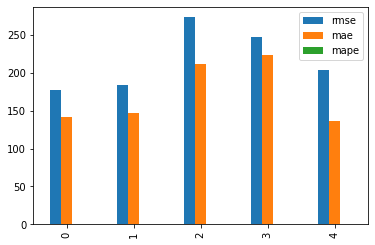

In [ ]:
tss = TimeSeriesSplit(n_splits=5, test_size=100, gap=1)
fold = 0
preds = []
scores = []
for train_idx, val_idx in tss.split(sales_aggregate_train):
  train = sales_aggregate_train.iloc[train_idx]
  test = sales_aggregate_train.iloc[val_idx]

  train_features = create_features(train)
  test_features = create_features(test)

  x_train = train_features[FEATURES]
  # print(x_train['weekofyear'].dtypes)
  y_train = train_features[TARGET]

  x_test = test_features[FEATURES]
  y_test = test_features[TARGET]

  reg = xgb.XGBRegressor(n_estimators=1000,
                         base_score=0.5,
                         booster='gblinear',
                         objective='reg:squarederror',
                         max_depth=6,
                         learning_rate=0.01,
                         early_stopping_rounds=100)
  reg.fit(x_train, y_train,
        eval_set=[(x_train,y_train), (x_test,y_test)],
        verbose=1000)
  
  y_pred = reg.predict(x_test)
  preds.append(y_pred)
  rmse = sqrt(mean_squared_error(y_test, y_pred))
  mae = mean_absolute_error(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)
  scores.append({"rmse" : rmse,
                 "mae" : mae,
                 "mape" : mape})
  fold += 1
pd.DataFrame(scores).plot(kind='bar')
scores_models['xgboost'] = scores

linear_regression [{'rmse': 241.28547844500417, 'mae': 184.87836576528932, 'mape': 0.23941241246529052}, {'rmse': 156.0020194378044, 'mae': 122.96753687145436, 'mape': 0.20195827766222724}, {'rmse': 242.12668537405173, 'mae': 158.7774930573097, 'mape': 0.26517105320682094}, {'rmse': 160.49097229314125, 'mae': 127.95375178041054, 'mape': 0.2724083822672295}, {'rmse': 255.32323103014133, 'mae': 178.14120436369845, 'mape': 0.2785400625595631}]
xgboost [{'rmse': 177.20548421531848, 'mae': 141.27289751464846, 'mape': 0.1950421073295736}, {'rmse': 183.29100036009973, 'mae': 147.21069287841797, 'mape': 0.2786024496001136}, {'rmse': 272.9121864493883, 'mae': 211.58659195312504, 'mape': 0.387426601671207}, {'rmse': 247.47318562177998, 'mae': 223.31340270751951, 'mape': 0.5006721349781849}, {'rmse': 203.3253435977783, 'mae': 135.81168437988282, 'mape': 0.23692686639334873}]


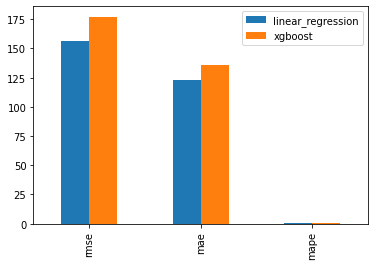

In [ ]:
min_scores = {}
for key, val in scores_models.items():
  print(key, val)
  minPricedrmse = min(val, key=lambda x:x['rmse'])['rmse']
  # print(minPricedrmse)
  minPricedmae = min(val, key=lambda x:x['mae'])['mae']
  # print(minPricedmae)
  minPricedmape = min(val, key=lambda x:x['mape'])['mape']
  # print(minPricedmape)

  min_scores[key] = {'rmse' : minPricedrmse, 'mae' : minPricedmae, 'mape' : minPricedmape}
pd.DataFrame(min_scores).plot(kind='bar')

### XGBoost Model Training and Results

In [ ]:
df_trc_xgb = sales_aggregate_by_date.copy()
df_trc_xgb.set_index('date', inplace=True)

In [ ]:
start_date = '2017-01-01'
end_date = '2019-09-01'
# Select DataFrame rows between two dates
mask = (df_trc_xgb.index > start_date) & (df_trc_xgb.index < end_date)

cut_off_date_start = '2019-09-01'
cut_off_date_end = '2019-09-30'
mask_test = (df_trc_xgb.index > cut_off_date_start) & (df_trc_xgb.index <= cut_off_date_end)

In [ ]:
train = df_trc_xgb.loc[mask , ['sales']]
test = df_trc_xgb.loc[mask_test, ['sales']]
print(train.head())
print(test.head())

              sales
date               
2017-01-02  767.294
2017-01-03  605.482
2017-01-04  717.250
2017-01-05  642.558
2017-01-06  712.956
              sales
date               
2019-09-02  452.000
2019-09-03  577.110
2019-09-04  511.400
2019-09-05  484.216
2019-09-06  545.710


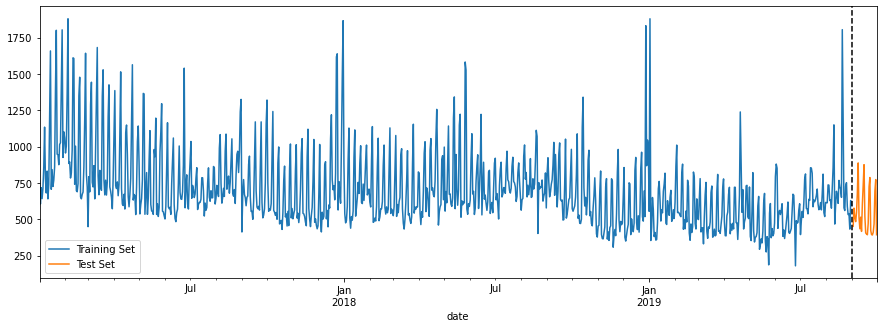

In [ ]:
fig, ax = plt.subplots(figsize=(15,5))
train.plot(y='sales',ax=ax, label='Training Set')
test.plot(y='sales',ax=ax, label='Test Set')
ax.axvline(cut_off_date_start, color='black', ls='--')
ax.legend(['Training Set', 'Test Set'])
plt.show()

In [ ]:
train_features = create_features(train)
test_features = create_features(test)

print(train_features.head(10))
print(test_features.head(10))

               sales  dayofweek  quarter  month  year  dayofyear  day
date                                                                 
2017-01-02   767.294          0        1      1  2017          2    2
2017-01-03   605.482          1        1      1  2017          3    3
2017-01-04   717.250          2        1      1  2017          4    4
2017-01-05   642.558          3        1      1  2017          5    5
2017-01-06   712.956          4        1      1  2017          6    6
2017-01-07   856.308          5        1      1  2017          7    7
2017-01-08  1134.366          6        1      1  2017          8    8
2017-01-09   778.618          0        1      1  2017          9    9
2017-01-10   681.274          1        1      1  2017         10   10
2017-01-11   831.850          2        1      1  2017         11   11
              sales  dayofweek  quarter  month  year  dayofyear  day
date                                                                
2019-09-02  452.000   

In [ ]:
FEATURES = ['dayofweek', 'quarter', 'month',
       'year', 'dayofyear', 'day']
TARGET = 'sales'


Split Dataset

In [ ]:
x_train = train_features[FEATURES]
y_train = train_features[TARGET]

x_test = test_features[FEATURES]
y_test = test_features[TARGET]

In [ ]:
reg = xgb.XGBRegressor(n_estimators=1000, early_stopping_rounds=50)
reg.fit(x_train, y_train,
        eval_set=[(x_train,y_train), (x_test,y_test)],
        verbose=100)

[12:56:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:679.873	validation_1-rmse:503.784
[100]	validation_0-rmse:107.355	validation_1-rmse:130.129
[200]	validation_0-rmse:90.3401	validation_1-rmse:125.211
[300]	validation_0-rmse:80.3954	validation_1-rmse:126.818
[400]	validation_0-rmse:71.6154	validation_1-rmse:113.919
[500]	validation_0-rmse:67.2591	validation_1-rmse:116.213
[600]	validation_0-rmse:61.8283	validation_1-rmse:129.867
[700]	validation_0-rmse:57.8406	validation_1-rmse:127.811
[800]	validation_0-rmse:55.4103	validation_1-rmse:125.967
[900]	validation_0-rmse:53.4298	validation_1-rmse:130.908
[999]	validation_0-rmse:50.2032	validation_1-rmse:134.243


XGBRegressor(early_stopping_rounds=50, n_estimators=1000)

In [ ]:
test['Prediction'] = reg.predict(x_test)

In [ ]:
start_date = '2018-08-01'
cut_off_date_end = '2019-09-30'
mask_test = (df_trc_xgb.index > start_date) & (df_trc_xgb.index <= cut_off_date_end)
df_trc_xgb_sample = df_trc_xgb.loc[mask_test , ['sales']]

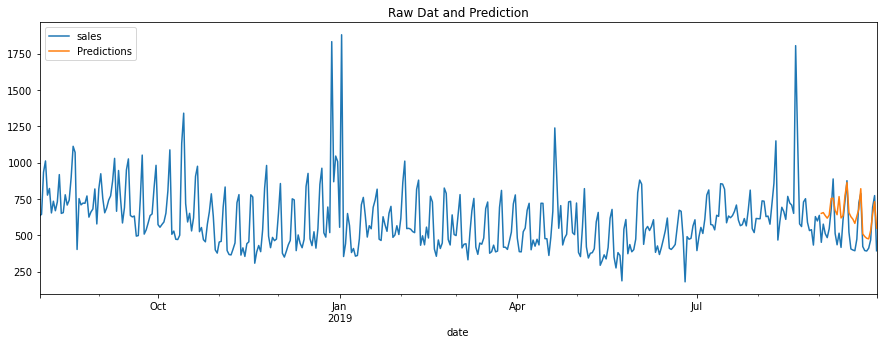

In [ ]:
df_trc_xgb_merged = df_trc_xgb_sample.merge(test['Prediction'], how='left', left_index=True, right_index=True)
ax = df_trc_xgb_merged[['sales']].plot(figsize=(15,5))
df_trc_xgb_merged['Prediction'].plot(ax=ax, style='-')
plt.legend(['sales', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

#### Testing to unseen dates for the forecast

In [ ]:
index = pd.date_range('2019-10-01', '2020-10-31', freq = 'D')
df = pd.DataFrame(index = index)
df['sales'] = None
unseen_test = create_features(df)
unseen_test.head()


,sales,dayofweek,quarter,month,year,dayofyear,day
2019-10-01,None,1,4,10,2019,274,1
2019-10-02,None,2,4,10,2019,275,2
2019-10-03,None,3,4,10,2019,276,3
2019-10-04,None,4,4,10,2019,277,4
2019-10-05,None,5,4,10,2019,278,5


In [ ]:
unseen_test['Prediction'] = reg.predict(unseen_test[FEATURES])
unseen_test.head()

,sales,dayofweek,quarter,month,year,dayofyear,day,Prediction
2019-10-01,None,1,4,10,2019,274,1,593.336731
2019-10-02,None,2,4,10,2019,275,2,587.999146
2019-10-03,None,3,4,10,2019,276,3,581.106689
2019-10-04,None,4,4,10,2019,277,4,601.155212
2019-10-05,None,5,4,10,2019,278,5,756.502014


In [ ]:
unseen_append = unseen_test[['sales','Prediction']]
df_unseen_viz = df_trc_xgb_merged.append(unseen_append)
df_unseen_viz.tail()


,sales,Prediction
2020-10-27,NaN,369.623962
2020-10-28,NaN,505.918030
2020-10-29,NaN,303.511993
2020-10-30,NaN,390.901703
2020-10-31,NaN,458.572388


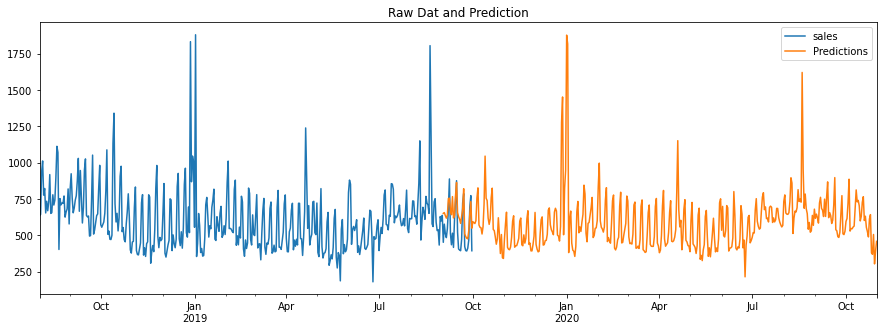

In [ ]:
ax = df_unseen_viz[['sales']].plot(figsize=(15,5))
df_unseen_viz['Prediction'].plot(ax=ax, style='-')
plt.legend(['sales', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

In [ ]:
# save in text format
reg.save_model("model_sklearn.txt")

In [ ]:
val = unseen_test.index[0]

In [ ]:
date_val = datetime.strptime('20220923', '%Y%m%d')

In [ ]:
date_val = date_val.strftime('%Y-%m-%d')

In [ ]:
df_result['date'] = pd.to_datetime(date_val)

In [ ]:
df_result

,date


In [ ]:
date_val.dayofweek

4

In [ ]:
type(val)

pandas._libs.tslibs.timestamps.Timestamp

In [ ]:
test['Prediction'] = reg.predict(x_test)

In [ ]:
extract = [
    date_val.dayofweek,
    date_val.quarter,
    date_val.month,
    date_val.year,
    date_val.dayofyear,
    date_val.day
]
features = np.array([extract])

In [ ]:
index = pd.date_range(date_val, date_val, freq = 'D')
df = pd.DataFrame(index = index)
df['sales'] = None
unseen_test = create_features(df)
unseen_test.head()


,sales,dayofweek,quarter,month,year,dayofyear,day
2022-09-23,None,4,3,9,2022,266,23


In [ ]:
reg.predict(unseen_test[FEATURES])[0]

497.9787

In [ ]:
def create_features(df) :
  """
  Create time series features based on time series index
  """
  # df = df.to_frame()
  df = df.copy()
  df['dayofweek'] = df.index.dayofweek
  df['quarter'] = df.index.quarter
  df['month'] = df.index.month
  df['year'] = df.index.year
  df['dayofyear'] = df.index.dayofyear
  df['day'] = df.index.day

  return df

### Linear Regression Model Training

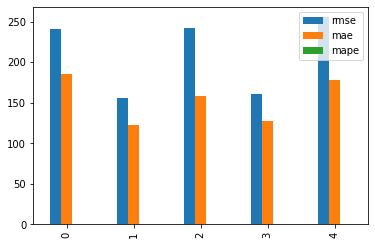

In [ ]:
tss = TimeSeriesSplit(n_splits=5, test_size=100, gap=1)
fold = 0
preds = []
scores = []
for train_idx, val_idx in tss.split(sales_aggregate_train):
  imputer = SimpleImputer(missing_values=np.nan, strategy='mean')

  train = sales_aggregate_train.iloc[train_idx]
  test = sales_aggregate_train.iloc[val_idx]

  train_features = create_features(train)
  test_features = create_features(test)

  imputer = SimpleImputer(missing_values=np.NaN, strategy='mean')

  train_features = fill_nan(train_features, imputer, ['lag1', 'lag2', 'lag3'])
  test_features = fill_nan(test_features, imputer, ['lag1', 'lag2', 'lag3'])

  # train_features = train_features.dropna()
  # test_features = test_features.dropna()

  x_train = train_features[FEATURES]
  # print(x_train['weekofyear'].dtypes)
  y_train = train_features[TARGET]

  x_test = test_features[FEATURES]
  y_test = test_features[TARGET]

  lr_model = LinearRegression()


  # fitting the training data
  LR.fit(x_train,y_train)

  
  y_pred = LR.predict(x_test)
  preds.append(y_pred)
  rmse = sqrt(mean_squared_error(y_test, y_pred))
  mae = mean_absolute_error(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)
  scores.append({"rmse" : rmse,
                 "mae" : mae,
                 "mape" : mape})
  fold += 1

pd.DataFrame(scores).plot(kind='bar')
scores_models['linear_regression'] = scores

In [ ]:
train_features = fill_nan(train_features, imputer, ['lag1', 'lag2', 'lag3'])
test_features = fill_nan(test_features, imputer, ['lag1', 'lag2', 'lag3'])

In [ ]:
sales_aggregate_train